# Gaussian Distribution

# Applying Gaussian Distribution to Image Data
## Week 09
The aim of this notebook is to showcase the effectiveness of applying the Gaussian distribution/filtering algorithm to a given image. The mathematics behind this process has been described in a general format for a clearer understanding. Furthermore, after applying the algorithm, the stars in the dataset will look more like circles, and the artifacts existing in the image will become less visible. Thereafter, by applying a circle detection algorithm, one can estimate the number of stars with a better accuracy. 

## Brief Discription
### 2D Gaussian Distribution Formula
$$\Large f(x)=\frac{1}{\sigma \sqrt{2\pi}} \cdot e^P$$

Where we define $P$ as:
$$\Large P = - \frac{x^2 + y^2}{2 \sigma ^2}$$

Knowing that:
$$\Large \sigma = \sqrt{\frac{\sum \left( x_i - \mu \right)^2}{N}}$$

The visual representation of a 2 dimensional Gaussian distribution (also known as Normal distribution) can be seen below:

![](https://upload.wikimedia.org/wikipedia/commons/5/57/Multivariate_Gaussian.png)

> source: [Multivariate Gaussian - Wikimedia](https://commons.wikimedia.org/wiki/File:Multivariate_Gaussian.png
>)

## Libraries
The libraries used are listed in the cell below.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import skimage

## Function for Displaying Images
Shows a grid of images, where each image is a Numpy array. The images can be either:
- RGB
- grayscale.

---

### Parameters
1. list: List of the images to be displayed.
2. list_titles: list or None; Optional list of titles to be shown for each image.
3. list_cmaps: list or None; Optional list of cmap values for each image. If None, then cmap will be automatically inferred.
4. grid: boolean; If True, show a grid over each image
5. num_cols: int; Number of columns to show.
6. figsize: tuple of width, height; Value to be passed to pyplot.figure()
7. title_fontsize: int; Value to be passed to set_title().

In [140]:
def show_image_list(list_images, list_titles=None, list_cmaps=None, grid=True, num_cols=2, figsize=(20, 10), title_fontsize=30):
    assert isinstance(list_images, list)
    assert len(list_images) > 0
    assert isinstance(list_images[0], np.ndarray)

    if list_titles is not None:
        assert isinstance(list_titles, list)
        assert len(list_images) == len(list_titles), '%d imgs != %d titles' % (len(list_images), len(list_titles))

    if list_cmaps is not None:
        assert isinstance(list_cmaps, list)
        assert len(list_images) == len(list_cmaps), '%d imgs != %d cmaps' % (len(list_images), len(list_cmaps))

    num_images  = len(list_images)
    num_cols    = min(num_images, num_cols)
    num_rows    = int(num_images / num_cols) + (1 if num_images % num_cols != 0 else 0)

    # Create a grid of subplots.
    fig, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    
    # Create list of axes for easy iteration.
    if isinstance(axes, np.ndarray):
        list_axes = list(axes.flat)
    else:
        list_axes = [axes]

    for i in range(num_images):

        img    = list_images[i]
        title  = list_titles[i] if list_titles is not None else 'Image %d' % (i)
        cmap   = list_cmaps[i] if list_cmaps is not None else (None if img_is_color(img) else 'gray')
        
        list_axes[i].imshow(img, cmap=cmap)
        list_axes[i].set_title(title, fontsize=title_fontsize) 
        list_axes[i].grid(grid)

    for i in range(num_images, len(list_axes)):
        list_axes[i].set_visible(False)

    fig.tight_layout()
    _ = plt.show()

def img_is_color(img):

    if len(img.shape) == 3:
        # Check the color channels to see if they're all the same.
        c1, c2, c3 = img[:, : , 0], img[:, :, 1], img[:, :, 2]
        if (c1 == c2).all() and (c2 == c3).all():
            return True

    return False

## Comparing the Original and Blurred Images
Let $\sigma = 3$ for the Gaussian distribution algorithm. By doing so, the blurred image would be as shown below:

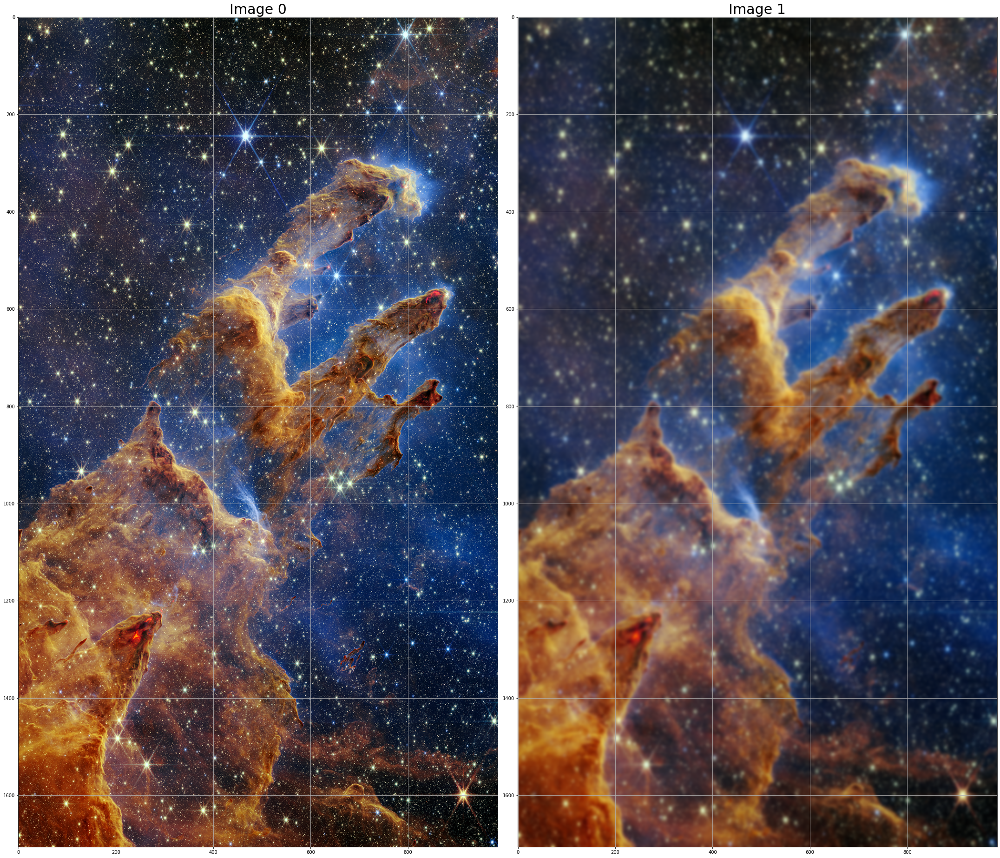

In [201]:
image = plt.imread("pillars.png")
imageList = [np.asarray(image)]
sigma = 3
blurred = skimage.filters.gaussian(
    image, sigma=(sigma, sigma), truncate=3, channel_axis=2)
imageList = [imageList[0], blurred]
show_image_list(imageList, figsize=(30, 30))

## Note
The image above is an example of what the algorithm can do, and has only been used for the sake of representation. Moving forward, a real FITS dataset will be used to apply the filter to a specific region. Also, finding the most suitable value for $\sigma$ is also a task in itself.

## Different Values of the Standard Deviation
One can observe the differences amongst the different levels of blur by iterating through the different values for $\sigma$. In the code cell below, the range of values of $i \in [0, 5)$ have been tested.

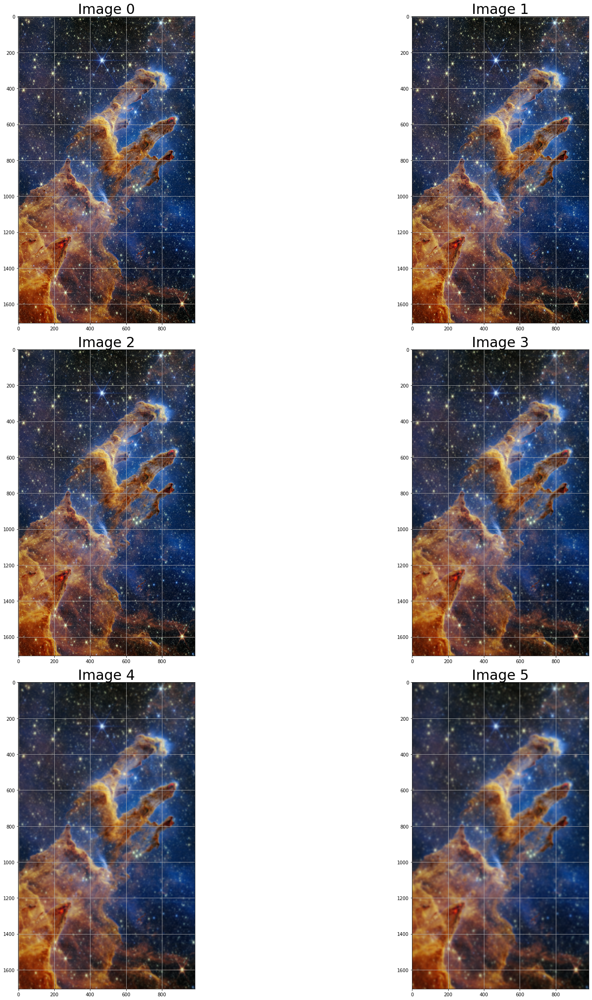

In [202]:
imageList = [np.asarray(image)]
for i in range(0, 5):
    sigma = i
    blurred = skimage.filters.gaussian(
    image, sigma=(sigma, sigma), truncate=3, channel_axis=2)
    imageList.append(np.asarray(blurred))

show_image_list(imageList, figsize=(30, 30))